# Fire Detection Model

#### This notebook contains the detailed code and results of making a Fire Detection model, the model is a binary image classification that predicts if an image contains fire or not. The code searxh with keras tuners for the "best" model, not considering the model large size, and in a second step the best "small" model.  

Use cases:
1. **Fire Emergency Response:**
   Implement the model in surveillance systems to detect fire occurrences and alert relevant authorities in real-time, enabling faster response and minimizing the impact of fire incidents on lives and property.
2. **Smart Home Safety:**
   Integrate the model into smart home systems for proactive fire monitoring. In case of a fire, homeowners receive immediate alerts for swift evacuation, and the system can trigger sprinkler systems to control the situation effectively.
3. **Forest Fire Monitoring:**
   Utilize drones equipped with the model to monitor forest areas for signs of fire, particularly in wildfire-prone regions. Real-time detection facilitates rapid firefighting measures, supporting environmental conservation efforts.
4. **Industrial Safety Compliance:**
   Deploy the model in industrial settings to monitor fire-related hazards, ensuring safety compliance and reducing the risk of workplace accidents associated with fire incidents.
5. **Insurance Claim Verification:**
   Insurers can employ the model to validate fire damage claims by comparing claimant-provided images with the model's fire identification. This assists in fraud detection and improves the accuracy of claim processing.


#### The first step was creating the dataset:

The first step was to create the dataset. We combined many datasets of indoor and outdoor datasets:
-	Fire Dataset (https://www.kaggle.com/datasets/phylake1337/fire-dataset 406 MB)  755 outdoor-fire images some of them contains heavy smoke, 244 non-fire_images .
-	Forest Fire Dataset (https://www.kaggle.com/datasets/alik05/forest-fire-dataset 149 MB) 950 fire images  950 non-fire_images .
-	Fire Detection Dataset (https://www.kaggle.com/datasets/atulyakumar98/test-dataset 138 MB) 110 fire-images and 541 non-fire images
-	Custom dataset  494 fire images, and 523 non_fire images made by searching the following key words.
 search_queries =  ['Kitchen fire', 'Electrical fire', 'Electric appliance fire', 'Short circuit fire', 'Overloaded circuit fire', 'Fuse box fire', 'Wiring fire', 'Outlet fire', 'Power surge fire', 'Clothes on fire', 'Burning clothes', 'Office fire', 'Bedroom fire', 'Living room fire', 'Apartment fire', 'Forest fire', 'Wildfire', 'Grassland fire', 'Bushfire', 'Bonfire', 'Industrial fire', 'Car fire', 'Vehicle fire', 'Dumpster fire', 'Gas station fire', 'Smoke and fire']
And the same terms without fire were added to the non_fire images. Plus, the maple tree images were added to help the model detect that the red color in the tree is not enough to be considered as fire. 


In [1]:
#Show each Cell's Execution Time
!pip install ipython-autotime
%load_ext autotime

time: 522 µs (started: 2023-09-04 15:46:25 +00:00)


# Import Libraries

In [2]:
import tensorflow as tf
import keras

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os 
import shutil 

from keras_tuner import RandomSearch
from keras_tuner.engine.hyperparameters import HyperParameters

from tensorflow.keras.applications import EfficientNetV2M,InceptionResNetV2,MobileNetV2,DenseNet121,EfficientNetV2B1,NASNetMobile
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input as efficientnet_v2_preprocess_fn
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input as resnet_v2_preprocess_fn
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_v2_preprocess_fn
from tensorflow.keras.applications.densenet import preprocess_input as densenet_preprocess_fn
from tensorflow.keras.applications.nasnet  import preprocess_input as nasnet_preprocess_fn

from tensorflow.keras.layers import (GlobalAveragePooling2D, Activation, MaxPooling2D, Add, Conv2D, MaxPool2D, Dense,
                                     Flatten, InputLayer, BatchNormalization, Input, RandomRotation,RandomFlip,
                                     Dropout, LayerNormalization,  Rescaling, Resizing, Reshape )

import tensorflow.keras.backend as K

from tensorflow.train import BytesList, FloatList, Int64List
from tensorflow.train import Example, Features, Feature

# from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras import Model, Input 
from tensorflow.keras.optimizers import Adam,  RMSprop , SGD 
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.image import resize_with_crop_or_pad
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow import cast, expand_dims, int32
from tensorflow.keras.metrics import (TruePositives,TrueNegatives,FalsePositives,FalseNegatives , Recall, Precision,BinaryAccuracy, TopKCategoricalAccuracy,AUC)
from tensorflow.keras.regularizers  import L2, L1

from sklearn.metrics import confusion_matrix
from tensorflow.keras.callbacks import Callback, CSVLogger, EarlyStopping, LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau
from tensorboard.plugins.hparams import api as hp

from collections import Counter
import datetime
import wandb
from wandb.keras import WandbCallback

time: 1.5 s (started: 2023-09-04 15:46:25 +00:00)


In [3]:
# Delete all files and directories in the output directory
def clean_directory(output_directory):
    # Delete all files and directories in the output directory
    for item in os.listdir(output_directory):
        item_path = os.path.join(output_directory, item)
        try:
            if os.path.isfile(item_path) or os.path.islink(item_path):
                os.unlink(item_path)
            elif os.path.isdir(item_path):
                shutil.rmtree(item_path)  # Use shutil.rmtree to delete directories and their contents
        except Exception as e:
            print(f"Failed to delete {item_path}: {e}")

time: 1.16 ms (started: 2023-09-04 15:46:27 +00:00)


In [4]:
# After your training is complete and you want to delete files in the output directory
output_directory = '/kaggle/working'
clean_directory(output_directory)

time: 953 ms (started: 2023-09-04 15:46:27 +00:00)


In [6]:
# Clear Kaggle folders and their contents

# for file in os.listdir('/kaggle/working/'):
#     if file.endswith('.hdf5'):
#         os.remove(file)

# clear_kaggle_folders('/kaggle/working/keras_tuner_dir')
# clear_kaggle_folders('/kaggle/working/wandb')

time: 406 µs (started: 2023-09-04 14:16:43 +00:00)


# Define the metrics

In [7]:
def f1_score(y_true, y_pred):
    y_true = K.round(y_true)
    y_pred = K.round(y_pred)
    
    tp = K.sum(K.cast(y_true * y_pred, 'float'), axis=0)
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float'), axis=0)
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float'), axis=0)
    
    precision = tp / (tp + fp + K.epsilon())
    recall = tp / (tp + fn + K.epsilon())
    
    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    f1 = tf.where(tf.math.is_nan(f1), tf.zeros_like(f1), f1)
    
    return K.mean(f1)

time: 956 µs (started: 2023-09-04 14:16:44 +00:00)


In [8]:
METRICS = [Recall(name='recall'),
           Precision(name='precision'), 
           BinaryAccuracy(name='accuracy'),
#            TopKCategoricalAccuracy(k=2,name="top_k_accuracy"),
#            AUC(name='AUC'), 
           f1_score ]
LABELS = ['Fire', 'NonFire']

time: 4.93 s (started: 2023-09-04 14:16:44 +00:00)


# Wandb

In [9]:
# from kaggle_secrets import UserSecretsClient
# user_secrets = UserSecretsClient()
# my_secret = user_secrets.get_secret("wandb_api_key") 
# wandb.login(key=my_secret)

time: 365 µs (started: 2023-09-04 14:16:49 +00:00)


# Configuratoin Dictionary

In [10]:
CONFIGURATION = {
    "CLASS_NAMES": ['fire', 'non_fire'],
    "BATCH_SIZE" : 32,
    "IMG_SIZE" : (224,224),
    "EPOCHS": 50,
    "FINE_TUNING_EPOCHS": 50, 
    "CLASS_WEIGHT" :  {0: 1 , 1:1},
    "NUM_CLASSES":2,
    "LABEL_MODE":'binary',
    "COLOR_MODE":'rgb',
    "LEARNING_RATE": 1e-3,
    "LEARNING_RATE_FINE_TUNING":1e-5,
    "REGULARIZATION_RATE":1e-3,
    "DROPOUT_RATE": 0.3,
################################################################################################
"train_data_dir" : '/kaggle/input/firedataset-jpg-224/FireDataset-V6-JPG-Reshaped224/train',
"val_data_dir" : '/kaggle/input/firedataset-jpg-224/FireDataset-V6-JPG-Reshaped224/val',
"test_data_dir" : '/kaggle/input/firedataset-jpg-224/FireDataset-V6-JPG-Reshaped224/test',
}
# CONFIGURATION["BATCH_SIZE"]

time: 942 µs (started: 2023-09-04 14:16:49 +00:00)


# Define paths


In [11]:
train_data_dir = CONFIGURATION["train_data_dir"]
val_data_dir = CONFIGURATION["val_data_dir"]
test_data_dir = CONFIGURATION["test_data_dir"]

time: 586 µs (started: 2023-09-04 14:16:52 +00:00)


# Data Augmentation

In [12]:
### tf.keras.layer augment , By default, random rotations are only applied during training.
augment_layers = tf.keras.Sequential([
    RandomRotation(factor = (-0.025, 0.025)),
    RandomFlip(mode='horizontal',)   ])

@tf.function
def augment_layer(image, label):
    return augment_layers(image, training = False), label

time: 16.4 ms (started: 2023-09-04 14:16:54 +00:00)


# Load Data with image_dataset_from_directory to Datasets

In [13]:
def create_ds(directory, batch_size, augment=False, augment_fn=augment_layer):
    dataset = tf.keras.utils.image_dataset_from_directory(
        directory,
        labels='inferred',
        label_mode=CONFIGURATION["LABEL_MODE"],
        class_names=CONFIGURATION["CLASS_NAMES"],
        color_mode=CONFIGURATION["COLOR_MODE"],
        batch_size=batch_size,
        image_size=CONFIGURATION["IMG_SIZE"],
        shuffle=True,
        seed=99)
    if augment == True:
        dataset = dataset.map(augment_layer,num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)
    else:
        dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset
 

time: 949 µs (started: 2023-09-04 14:16:57 +00:00)


In [14]:
# Define paths
train_data_dir = CONFIGURATION["train_data_dir"]
val_data_dir = CONFIGURATION["val_data_dir"]
test_data_dir = CONFIGURATION["test_data_dir"]

train_dataset = create_ds(train_data_dir, CONFIGURATION["BATCH_SIZE"], augment=True, augment_fn=augment_layer)
val_dataset = create_ds(val_data_dir, CONFIGURATION["BATCH_SIZE"], augment=True, augment_fn=augment_layer)
test_dataset = create_ds(test_data_dir, CONFIGURATION["BATCH_SIZE"], augment=True, augment_fn=augment_layer)

Found 4014 files belonging to 2 classes.
Found 492 files belonging to 2 classes.
Found 524 files belonging to 2 classes.
time: 3.75 s (started: 2023-09-04 14:16:59 +00:00)


# Show example images

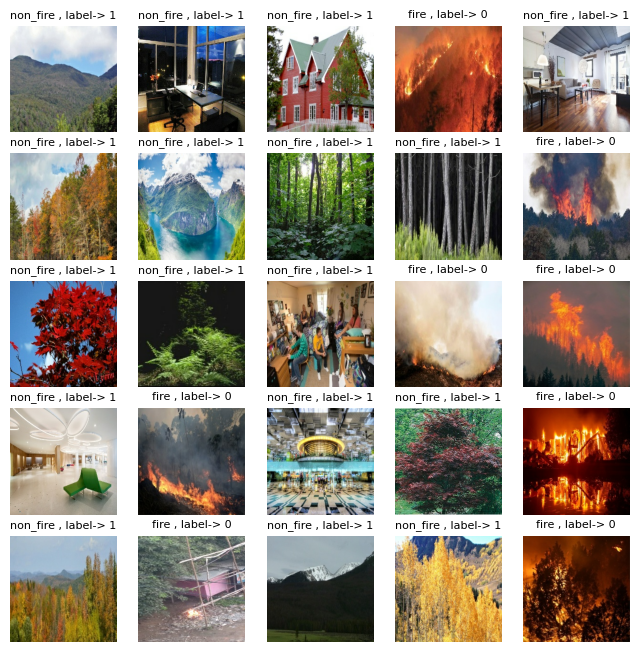

time: 2.66 s (started: 2023-09-04 14:18:23 +00:00)


In [22]:
plt.figure(figsize = (8,8))

for images, labels in train_dataset.take(1):
#     print(labels)
    for i in range(25):
#         print(tf.argmax(labels[i], axis = -1))
        ax = plt.subplot(5,5, i+1)
        plt.imshow(images[i]/255)
        #plt.title(CONFIGURATION["CLASS_NAMES"][tf.argmax(labels[i], axis = -1).numpy()]) # for many classes and one hot encoding
        plt.title(CONFIGURATION["CLASS_NAMES"][ int(labels[i]) ]+' , label-> '+ str(int(labels[i])), fontsize=8)
        plt.axis("off")

# Class Weight

In [15]:
train_dataset = train_dataset
num_classes = 2
class_counts = [0] * num_classes
for _, labels in train_dataset:
    for label in labels:
        class_counts[int(label.numpy()[0])] += 1
print(class_counts)

[1931, 2083]
time: 20.5 s (started: 2023-09-04 14:17:11 +00:00)


In [16]:
Fire = class_counts[0]
NonFire = class_counts[1]
# total = counter.get(0) + counter.get(1)
total = Fire + NonFire

weight_for_Fire = (1 / Fire) * (total / 2.0)
weight_for_NonFire = (1 / NonFire) * (total / 2.0)

CLASS_WEIGHT = {0: weight_for_Fire, 1: weight_for_NonFire}
print('Class Weights: ', CLASS_WEIGHT)

CONFIGURATION["CLASS_WEIGHT"] = CLASS_WEIGHT

Class Weights:  {0: 1.0393578456758155, 1: 0.9635141622659625}
time: 1.19 ms (started: 2023-09-04 14:17:32 +00:00)


# Load Trained models

In [17]:
base_models = {
    # Big models:
    'EfficientNetV2M': EfficientNetV2M(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
    'InceptionResNetV2':InceptionResNetV2(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
    #######################################################################################
    #small models:
    'MobileNetV2':MobileNetV2(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
    'DenseNet121': DenseNet121(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
    'EfficientNetV2B1':EfficientNetV2B1(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
    'NASNetMobile': NASNetMobile(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
    }

19993432/19993432 [==============================] - 0s 0us/step
time: 31.7 s (started: 2023-09-04 14:17:32 +00:00)


In [18]:
def no_pre_processing_fn(x):
    return x

time: 390 µs (started: 2023-09-04 14:18:04 +00:00)


In [19]:
pre_processing_functions = {
    'EfficientNetV2M': efficientnet_v2_preprocess_fn,
    'InceptionResNetV2':resnet_v2_preprocess_fn,
    #################################################
    'MobileNetV2':  mobilenet_v2_preprocess_fn,
    'DenseNet121': densenet_preprocess_fn,
    'EfficientNetV2B1':efficientnet_v2_preprocess_fn,
    'NASNetMobile' :nasnet_preprocess_fn
}

time: 7.38 ms (started: 2023-09-04 14:18:04 +00:00)


In [20]:
# Adding the resize_rescale sequential model as a layer inside the model can afford the model to accept any image size
resize_rescale_layers = tf.keras.Sequential([
    Resizing(CONFIGURATION["IMG_SIZE"][0],CONFIGURATION["IMG_SIZE"][0]),
    Rescaling(1.0/255)
                      ])

resize_layers = tf.keras.Sequential([
    Resizing(CONFIGURATION["IMG_SIZE"][0],CONFIGURATION["IMG_SIZE"][0])
                                        ])

time: 12.8 ms (started: 2023-09-04 14:18:04 +00:00)


# CallBacks

In [21]:
CSVLogger_callback = CSVLogger('logs.csv',separator=',', append=True)
EarlyStopping_callback = EarlyStopping(monitor='val_loss', min_delta=0, patience=6, verbose=1,mode='auto', baseline=None, restore_best_weights=False)
ModelCheckpoint_callback = ModelCheckpoint('weights.{epoch:02d}-{val_loss:.2f}.hdf5', monitor='val_loss', verbose=0,save_best_only=True,
                                      save_weights_only=True, mode='auto', save_freq='epoch')
ReduceLROnPlateau_callback = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=5, verbose=1)

CALLBACKS = [CSVLogger_callback, EarlyStopping_callback, ModelCheckpoint_callback,ReduceLROnPlateau_callback ]

time: 1.1 ms (started: 2023-09-04 14:18:04 +00:00)


# Finding the best "Large" Model

# Keras Tuner

In [75]:
# Define a simple model function
def build_model(hp):
    BASE_MDOEL_CHOICE = hp.Choice('BaseModel',values=['EfficientNetV2M','InceptionResNetV2'])
    
    NEURONS_L1 = hp.Choice('NeuronsL1', values=[32,64,128])
    NEURONS_L2 = hp.Choice('NeuronsL2', values=[32,64,128])
    
#     DROP_OUT = hp.Choice('DropOut', values=[0.1,0.2,0.3])
    DROP_OUT =  CONFIGURATION["DROPOUT_RATE"]

    BATCH_SIZE = hp.Choice('BatchSize', values=[32,64,])
#     BATCH_SIZE = CONFIGURATION["BATCH_SIZE"]

#     LEARNING_RATE = hp.Choice('LearningRate', values=[1e-4,1e-3,1e-2,1e-1])
    LEARNING_RATE = CONFIGURATION["LEARNING_RATE"]

    REGULARIZATION_RATE = CONFIGURATION["REGULARIZATION_RATE"]

    #     OPTIMIZER_CHOICE = hp.Choice('Optimizer', values=['Adam','RMSprop','SGD'])
#     if OPTIMIZER_CHOICE == 'Adam':
#         OPTIMIZER =  Adam(learning_rate=LEARNING_RATE) 
#     elif OPTIMIZER_CHOICE =='RMSprop':
#         OPTIMZER = RMSprop(learning_rate=LEARNING_RATE)
#     elif OPTIMIZER_CHOICE == 'SGD':
#         OPTIMZER = SGD(learning_rate=LEARNING_RATE)     
    OPTIMIZER = Adam(learning_rate = LEARNING_RATE)   
    
    global train_dataset, val_dataset, test_dataset
    train_dataset= create_ds(train_data_dir,BATCH_SIZE, augment=True, augment_fn=augment_layer)
    val_dataset = create_ds(val_data_dir,BATCH_SIZE, augment=False)
    test_dataset = create_ds(test_data_dir, BATCH_SIZE, augment=False)
    
    base_model = base_models[BASE_MDOEL_CHOICE]
    preprocess_input = pre_processing_functions[BASE_MDOEL_CHOICE]

    fine_tune_limit = len(base_model.layers) - int(0.1*len(base_model.layers))
    base_model.trainable = True
    for layer in base_model.layers[:fine_tune_limit]:
        layer.trainable=False


    inputs = Input(shape = (None, None, 3), name='input_layer')
    x = resize_layers(inputs)
    x = preprocess_input(x)
    
    #Run base model in Inference mode by passing training=false,This is important for fine-tuning.
    x = base_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dropout(DROP_OUT)(x)
    
    x = Dense(NEURONS_L1, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_1')(x)
    x = BatchNormalization()(x)  
    
    x = Dense(NEURONS_L2, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_2')(x)
    x = BatchNormalization()(x) 
    
    # x = Dense(NEURONS_L3, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_3')(x)
    x = Dropout(DROP_OUT)(x)

    outputs =  Dense(1, activation='sigmoid', name='output_layer')(x)
    model = Model(inputs, outputs)

    #     steps_per_epoch = train_generator.n // BATCH_SIZE  
    #     validation_steps = val_generator.n // BATCH_SIZE

    model.compile(optimizer= OPTIMIZER,loss='binary_crossentropy',metrics=METRICS)
    return model

time: 4.98 ms (started: 2023-09-02 06:17:56 +00:00)


In [76]:
# clear_kaggle_folders(kaggle_folders)

time: 10.9 ms (started: 2023-09-02 06:17:56 +00:00)


In [77]:
# Initialize the Keras Tuner RandomSearch object
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',  # Metric to optimize
    max_trials=50,              # Number of different model configurations to try
    executions_per_trial=1,
    directory='keras_tuner_dir',
    project_name="FireDetection",# Directory to store tuning results
    overwrite=True , # This ensures that only the latest checkpoint is saved
)

# Search for the best hyperparameter configuration
tuner.search(train_dataset,
             epochs=3,
             validation_data=val_dataset,
             callbacks=CALLBACKS) # Prevent saving of models during search

Trial 17 Complete [00h 02m 44s]
val_accuracy: 0.9878048896789551

Best val_accuracy So Far: 0.9898374080657959
Total elapsed time: 00h 46m 29s
time: 46min 33s (started: 2023-09-02 06:17:56 +00:00)


In [78]:
tuner.results_summary()

Results summary
Results in keras_tuner_dir/FireDetection
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 06 summary
Hyperparameters:
BaseModel: EfficientNetV2M
NeuronsL1: 32
NeuronsL2: 64
Score: 0.9898374080657959

Trial 08 summary
Hyperparameters:
BaseModel: EfficientNetV2M
NeuronsL1: 64
NeuronsL2: 64
Score: 0.9878048896789551

Trial 16 summary
Hyperparameters:
BaseModel: EfficientNetV2M
NeuronsL1: 32
NeuronsL2: 128
Score: 0.9878048896789551

Trial 02 summary
Hyperparameters:
BaseModel: EfficientNetV2M
NeuronsL1: 128
NeuronsL2: 64
Score: 0.9857723712921143

Trial 04 summary
Hyperparameters:
BaseModel: EfficientNetV2M
NeuronsL1: 128
NeuronsL2: 128
Score: 0.9857723712921143

Trial 05 summary
Hyperparameters:
BaseModel: EfficientNetV2M
NeuronsL1: 32
NeuronsL2: 32
Score: 0.9857723712921143

Trial 13 summary
Hyperparameters:
BaseModel: EfficientNetV2M
NeuronsL1: 64
NeuronsL2: 128
Score: 0.9837398529052734

Trial 07 summary
Hyperparameters:
BaseModel: Inception

In [79]:
# Get the top 2 hyperparameters.
best_hps = tuner.get_best_hyperparameters(5)
# Build the model with the best hp.
model = build_model(best_hps[0])
model.summary()

Found 4014 files belonging to 2 classes.
Found 492 files belonging to 2 classes.
Found 524 files belonging to 2 classes.
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, None, None, 3)]   0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 efficientnetv2-m (Functiona  (None, 7, 7, 1280)       53150388  
 l)                                                              
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_2 (Dropout)         (None, 1280)              0         
    

#####  The best hyper paramters that we were able to test (due to the lack of equipments) are the following: 

- BaseModel: EfficientNetV2M
- NeuronsL1: 32
- NeuronsL2: 64 


In [80]:
best_hps = tuner.get_best_hyperparameters()[0]
print("Best Hyperparameters:")
print(best_hps.values)  # Dictionary containing the best hyperparameters

Best Hyperparameters:
{'BaseModel': 'EfficientNetV2M', 'NeuronsL1': 32, 'NeuronsL2': 64}
time: 676 µs (started: 2023-09-02 07:04:32 +00:00)


# Size of models

In [81]:
for model_name in base_models:
    model = base_models[model_name]
    print(model.name)
    print(model.count_params()/1024)
    print(" --------- ")

efficientnetb6
40000.1396484375
 --------- 
efficientnetv2-m
51904.67578125
 --------- 
convnext_base
85514.125
 --------- 
inception_resnet_v2
53063.21875
 --------- 
NASNet
82926.580078125
 --------- 
mobilenetv2_1.00_224
2205.0625
 --------- 
efficientnetb2
7586.4931640625
 --------- 
efficientnetv2-b1
6768.67578125
 --------- 
time: 1.4 s (started: 2023-09-02 07:04:32 +00:00)


# Re-Build and Fine Tune best model

In [1]:
# !wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
Aborted!


In [24]:
# Initialize wandb
wandb.init(project="FireDataset")

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
cat: /sys/module/amdgpu/initstate: No such file or directory


time: 1min 10s (started: 2023-09-03 12:19:36 +00:00)


In [25]:
wandb_callBack = WandbCallback(monitor="val_loss", verbose=0, mode="auto")
CSVLogger_callback = CSVLogger('logs.csv',separator=',', append=True)
EarlyStopping_callback = EarlyStopping(monitor='val_loss', min_delta=0, patience=6, 
                                       verbose=1,mode='auto', baseline=None, restore_best_weights=False)
ReduceLROnPlateau_callback = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=5, verbose=1)

CALLBACKS_with_wandb = [wandb_callBack, CSVLogger_callback, EarlyStopping_callback, ReduceLROnPlateau_callback]

wandb: WARNING The save_model argument by default saves the model in the HDF5 format that cannot save custom objects like subclassed models and custom layers. This behavior will be deprecated in a future release in favor of the SavedModel format. Meanwhile, the HDF5 model is saved as W&B files and the SavedModel as W&B Artifacts.


time: 25.7 s (started: 2023-09-03 12:20:52 +00:00)


In [26]:
# Re define metrics so that the saved model does not contain f1-socre (it will lead to error when loading the model)
METRICS = [ Recall(name='recall'),
            Precision(name='precision'), 
            BinaryAccuracy(name='accuracy')
          ]

time: 24.5 ms (started: 2023-09-03 12:21:35 +00:00)


In [27]:
# best_base_model_choice = best_hps.get('BaseModel')
# best_NEURONS_L1_choice = best_hps.get('NeuronsL1')
# best_NEURONS_L2_choice = best_hps.get('NeuronsL2')

time: 1.77 ms (started: 2023-09-03 12:21:42 +00:00)


In [28]:
# print(best_base_model_choice)
# print(best_NEURONS_L1_choice)
# print(best_NEURONS_L2_choice)

time: 1.66 ms (started: 2023-09-03 12:21:43 +00:00)


In [29]:
best_base_model_choice = 'EfficientNetV2M'
best_NEURONS_L1_choice = 32
best_NEURONS_L2_choice = 64

time: 2.37 ms (started: 2023-09-03 12:21:43 +00:00)


In [30]:
BASE_MDOEL_CHOICE = best_base_model_choice
NEURONS_L1 = best_NEURONS_L1_choice 
NEURONS_L2 = best_NEURONS_L2_choice 
    
BATCH_SIZE = CONFIGURATION["BATCH_SIZE"]
LEARNING_RATE = CONFIGURATION["LEARNING_RATE"]
REGULARIZATION_RATE = CONFIGURATION["REGULARIZATION_RATE"] 
DROP_OUT =  CONFIGURATION["DROPOUT_RATE"] 
OPTIMIZER = Adam(learning_rate=LEARNING_RATE ) 

train_dataset= create_ds(train_data_dir,BATCH_SIZE, augment=True, augment_fn=augment_layer)
val_dataset = create_ds(val_data_dir,BATCH_SIZE, augment=False )
test_dataset = create_ds(test_data_dir, BATCH_SIZE, augment=False)
    
base_model = base_models[BASE_MDOEL_CHOICE]
base_model.trainable = False

preprocess_input = pre_processing_functions[BASE_MDOEL_CHOICE]

inputs = Input(shape = (None, None, 3), name='input_layer')
x = resize_layers(inputs)
x = preprocess_input(x)

#Run base model in Inference mode by passing training=false,This is important for fine-tuning.
x = base_model(x, training=False)
x = GlobalAveragePooling2D()(x)
x = Dropout(DROP_OUT)(x)
    
x = Dense(NEURONS_L1, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_1')(x)
x = BatchNormalization()(x)  
    
x = Dense(NEURONS_L2, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_2')(x)
x = BatchNormalization()(x) 
    
# x = Dense(NEURONS_L3, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_3')(x)
x = Dropout(DROP_OUT)(x)

outputs =  Dense(1, activation='sigmoid', name='output_layer')(x)
model_final = Model(inputs, outputs)

    #     steps_per_epoch = train_generator.n // BATCH_SIZE  
    #     validation_steps = val_generator.n // BATCH_SIZE

model_final.compile(optimizer= OPTIMIZER ,loss='binary_crossentropy',metrics=METRICS)
model_final.summary()

Found 4014 files belonging to 2 classes.
Found 492 files belonging to 2 classes.
Found 524 files belonging to 2 classes.
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, None, None, 3)]   0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 efficientnetv2-m (Functiona  (None, 7, 7, 1280)       53150388  
 l)                                                              
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1280)              0         
      

# Train 40 epochs

In [31]:
history = model_final.fit(train_dataset,
                         epochs= CONFIGURATION["EPOCHS"], 
                         callbacks=CALLBACKS_with_wandb,
                         validation_data=val_dataset,
                         class_weight=CONFIGURATION["CLASS_WEIGHT"] )

Epoch 1/50
126/126 [==============================] - ETA: 0s - loss: 0.2683 - recall: 0.9342 - precision: 0.9479 - accuracy: 0.9392

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230903_122014-2si8qmrw/files/model-best)... Done. 1.0s


126/126 [==============================] - 283s 2s/step - loss: 0.2683 - recall: 0.9342 - precision: 0.9479 - accuracy: 0.9392 - val_loss: 0.2274 - val_recall: 0.9700 - val_precision: 0.9848 - val_accuracy: 0.9756 - lr: 0.0010


wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230903_122014-2si8qmrw/files/model-best)... Done. 1.0s


126/126 [==============================] - 241s 2s/step - loss: 0.1829 - recall: 0.9717 - precision: 0.9721 - accuracy: 0.9709 - val_loss: 0.1827 - val_recall: 0.9850 - val_precision: 0.9741 - val_accuracy: 0.9776 - lr: 0.0010
Epoch 3/50
126/126 [==============================] - ETA: 0s - loss: 0.1560 - recall: 0.9808 - precision: 0.9841 - accuracy: 0.9818

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230903_122014-2si8qmrw/files/model-best)... Done. 1.1s


126/126 [==============================] - 244s 2s/step - loss: 0.1560 - recall: 0.9808 - precision: 0.9841 - accuracy: 0.9818 - val_loss: 0.1675 - val_recall: 0.9700 - val_precision: 0.9848 - val_accuracy: 0.9756 - lr: 0.0010
Epoch 4/50
126/126 [==============================] - 33s 259ms/step - loss: 0.1450 - recall: 0.9822 - precision: 0.9832 - accuracy: 0.9821 - val_loss: 0.1693 - val_recall: 0.9775 - val_precision: 0.9739 - val_accuracy: 0.9736 - lr: 0.0010
Epoch 5/50
126/126 [==============================] - ETA: 0s - loss: 0.1355 - recall: 0.9832 - precision: 0.9860 - accuracy: 0.9841

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230903_122014-2si8qmrw/files/model-best)... Done. 1.0s


126/126 [==============================] - 243s 2s/step - loss: 0.1355 - recall: 0.9832 - precision: 0.9860 - accuracy: 0.9841 - val_loss: 0.1669 - val_recall: 0.9813 - val_precision: 0.9740 - val_accuracy: 0.9756 - lr: 0.0010
Epoch 6/50
126/126 [==============================] - 32s 248ms/step - loss: 0.1292 - recall: 0.9842 - precision: 0.9842 - accuracy: 0.9836 - val_loss: 0.1734 - val_recall: 0.9813 - val_precision: 0.9776 - val_accuracy: 0.9776 - lr: 0.0010
Epoch 7/50
126/126 [==============================] - ETA: 0s - loss: 0.1185 - recall: 0.9832 - precision: 0.9899 - accuracy: 0.9860

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230903_122014-2si8qmrw/files/model-best)... Done. 1.0s



Epoch 7: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
126/126 [==============================] - 245s 2s/step - loss: 0.1185 - recall: 0.9832 - precision: 0.9899 - accuracy: 0.9860 - val_loss: 0.1564 - val_recall: 0.9775 - val_precision: 0.9812 - val_accuracy: 0.9776 - lr: 0.0010
Epoch 8/50
126/126 [==============================] - ETA: 0s - loss: 0.1016 - recall: 0.9938 - precision: 0.9938 - accuracy: 0.9935

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230903_122014-2si8qmrw/files/model-best)... Done. 0.9s


126/126 [==============================] - 246s 2s/step - loss: 0.1016 - recall: 0.9938 - precision: 0.9938 - accuracy: 0.9935 - val_loss: 0.1536 - val_recall: 0.9813 - val_precision: 0.9813 - val_accuracy: 0.9797 - lr: 1.0000e-04
Epoch 9/50
126/126 [==============================] - ETA: 0s - loss: 0.1008 - recall: 0.9938 - precision: 0.9914 - accuracy: 0.9923

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230903_122014-2si8qmrw/files/model-best)... Done. 1.1s


126/126 [==============================] - 248s 2s/step - loss: 0.1008 - recall: 0.9938 - precision: 0.9914 - accuracy: 0.9923 - val_loss: 0.1531 - val_recall: 0.9738 - val_precision: 0.9886 - val_accuracy: 0.9797 - lr: 1.0000e-04
Epoch 10/50
126/126 [==============================] - 32s 248ms/step - loss: 0.0994 - recall: 0.9933 - precision: 0.9914 - accuracy: 0.9920 - val_loss: 0.1535 - val_recall: 0.9738 - val_precision: 0.9848 - val_accuracy: 0.9776 - lr: 1.0000e-04
Epoch 11/50
126/126 [==============================] - 31s 242ms/step - loss: 0.0946 - recall: 0.9928 - precision: 0.9947 - accuracy: 0.9935 - val_loss: 0.1571 - val_recall: 0.9738 - val_precision: 0.9886 - val_accuracy: 0.9797 - lr: 1.0000e-04
Epoch 12/50
126/126 [==============================] - 31s 243ms/step - loss: 0.1014 - recall: 0.9894 - precision: 0.9904 - accuracy: 0.9895 - val_loss: 0.1568 - val_recall: 0.9738 - val_precision: 0.9924 - val_accuracy: 0.9817 - lr: 1.0000e-04
Epoch 13/50
126/126 [=============

In [33]:
# ُEvaluation before the Fine Tuning
model_final.evaluate(test_dataset)

17/17 [==============================] - 4s 201ms/step - loss: 0.1203 - recall: 0.9857 - precision: 0.9718 - accuracy: 0.9771


[0.1202845647931099,
 0.9857142567634583,
 0.9718309640884399,
 0.9770992398262024]

time: 3.81 s (started: 2023-09-03 12:57:27 +00:00)


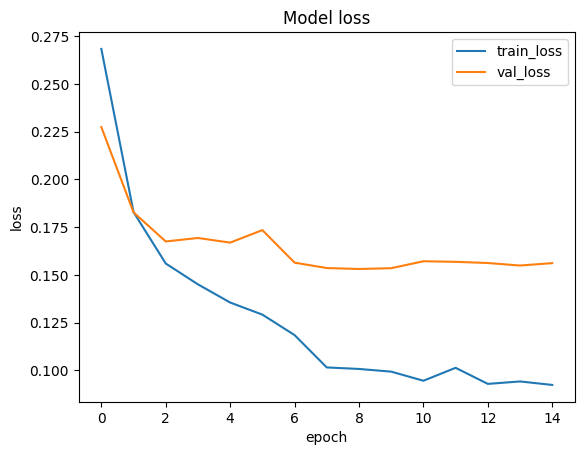

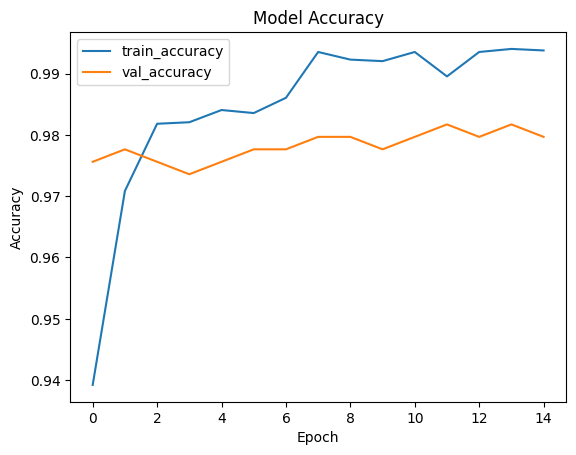

time: 732 ms (started: 2023-09-03 12:59:34 +00:00)


In [34]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss', 'val_loss'])
plt.show()

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train_accuracy', 'val_accuracy'])
plt.show()

# Fine Tuning

In [39]:
#Fine Tuning
# Fine Tuning with freezing 95% of the model: setting fine_tuning limit to base_mdoel len - 5% 
base_model.trainable = True
fine_tune_limit = len(base_model.layers) - int(0.05*len(base_model.layers))

for layer in base_model.layers[:fine_tune_limit]:
    layer.trainable=False

model_final.compile(optimizer= Adam(learning_rate =CONFIGURATION["LEARNING_RATE_FINE_TUNING"] ), loss='binary_crossentropy', metrics=METRICS)

time: 95.1 ms (started: 2023-09-03 13:04:07 +00:00)


In [40]:
history_fine_tuning = model_final.fit(train_dataset, 
                                      epochs= CONFIGURATION["FINE_TUNING_EPOCHS"], 
                                      callbacks=CALLBACKS_with_wandb,
                                      validation_data=val_dataset,
                                      class_weight=CONFIGURATION["CLASS_WEIGHT"]
                                     )

Epoch 1/50
126/126 [==============================] - ETA: 0s - loss: 0.0923 - recall: 0.9937 - precision: 0.9907 - accuracy: 0.9918

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230903_122014-2si8qmrw/files/model-best)... Done. 1.4s


126/126 [==============================] - 291s 2s/step - loss: 0.0923 - recall: 0.9937 - precision: 0.9907 - accuracy: 0.9918 - val_loss: 0.1527 - val_recall: 0.9700 - val_precision: 0.9848 - val_accuracy: 0.9756 - lr: 1.0000e-05
Epoch 2/50
126/126 [==============================] - 36s 281ms/step - loss: 0.0857 - recall: 0.9947 - precision: 0.9971 - accuracy: 0.9958 - val_loss: 0.1577 - val_recall: 0.9813 - val_precision: 0.9813 - val_accuracy: 0.9797 - lr: 1.0000e-05
Epoch 3/50
126/126 [==============================] - 35s 276ms/step - loss: 0.0813 - recall: 0.9957 - precision: 0.9986 - accuracy: 0.9970 - val_loss: 0.1560 - val_recall: 0.9775 - val_precision: 0.9849 - val_accuracy: 0.9797 - lr: 1.0000e-05
Epoch 4/50
126/126 [==============================] - 35s 277ms/step - loss: 0.0822 - recall: 0.9971 - precision: 0.9990 - accuracy: 0.9980 - val_loss: 0.1576 - val_recall: 0.9775 - val_precision: 0.9812 - val_accuracy: 0.9776 - lr: 1.0000e-05
Epoch 5/50
126/126 [=================

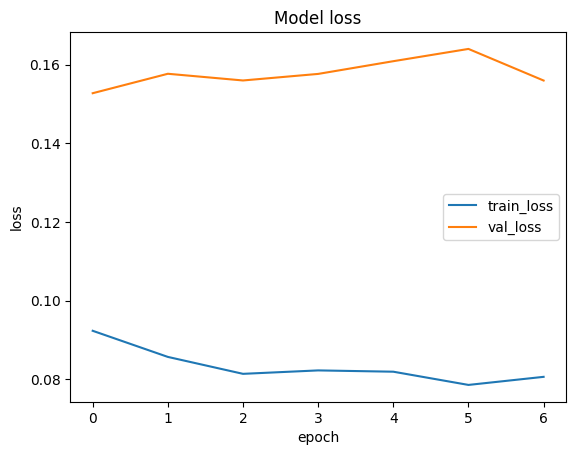

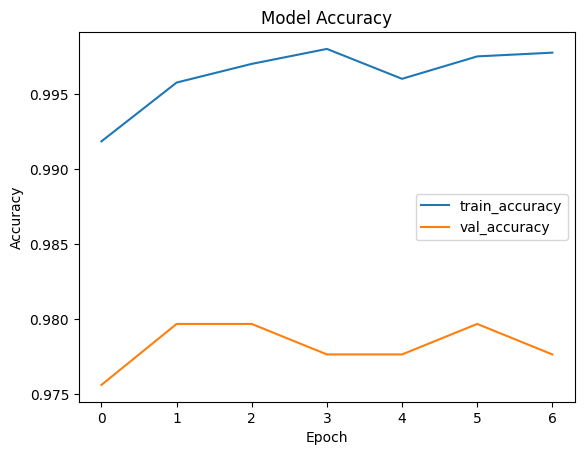

time: 644 ms (started: 2023-09-03 13:13:56 +00:00)


In [41]:
plt.plot(history_fine_tuning.history['loss'])
plt.plot(history_fine_tuning.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss', 'val_loss'])
plt.show()

plt.plot(history_fine_tuning.history['accuracy'])
plt.plot(history_fine_tuning.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train_accuracy', 'val_accuracy'])
plt.show()

# Evaluate the model

In [42]:
# Evaluate the model on the test dataset
model_final.evaluate(test_dataset)

17/17 [==============================] - 4s 199ms/step - loss: 0.1131 - recall: 0.9857 - precision: 0.9787 - accuracy: 0.9809


[0.11307007074356079,
 0.9857142567634583,
 0.978723406791687,
 0.9809160232543945]

time: 3.9 s (started: 2023-09-03 13:14:08 +00:00)


# Save the model

In [ ]:
# clear_kaggle_folders(kaggle_folders)

In [43]:
# Assuming you have a Keras model named "model"
model_final.save('model.h5')

time: 1.56 s (started: 2023-09-03 13:15:15 +00:00)


In [44]:
# Assuming you have a Keras model named "model"
tf.saved_model.save(model_final, 'model')

time: 3min 32s (started: 2023-09-03 13:15:26 +00:00)


In [ ]:
# clear_kaggle_folders(kaggle_folders)

In [47]:
import zipfile

# Specify the paths
model_dir = 'model'
zip_file_name = 'model.zip'

# Create a ZIP archive
with zipfile.ZipFile(zip_file_name, 'w', zipfile.ZIP_DEFLATED) as zipf:
    # Recursively add the model directory to the archive
    for root, _, files in os.walk(model_dir):
        for file in files:
            file_path = os.path.join(root, file)
            archive_path = os.path.relpath(file_path, model_dir)
            zipf.write(file_path, archive_path)

time: 19.9 s (started: 2023-09-03 13:24:55 +00:00)


# Load saved model

In [45]:
model_final = tf.keras.models.load_model('/kaggle/working/model.h5')

time: 10.8 s (started: 2023-09-03 13:24:24 +00:00)


In [46]:
# Evaluate the loaded model on the test dataset
model_final.evaluate(test_dataset)

17/17 [==============================] - 10s 210ms/step - loss: 0.1131 - recall: 0.9857 - precision: 0.9787 - accuracy: 0.9809


[0.11307007074356079,
 0.9857142567634583,
 0.978723406791687,
 0.9809160232543945]

time: 10.4 s (started: 2023-09-03 13:24:35 +00:00)


# Testing saved model on testset

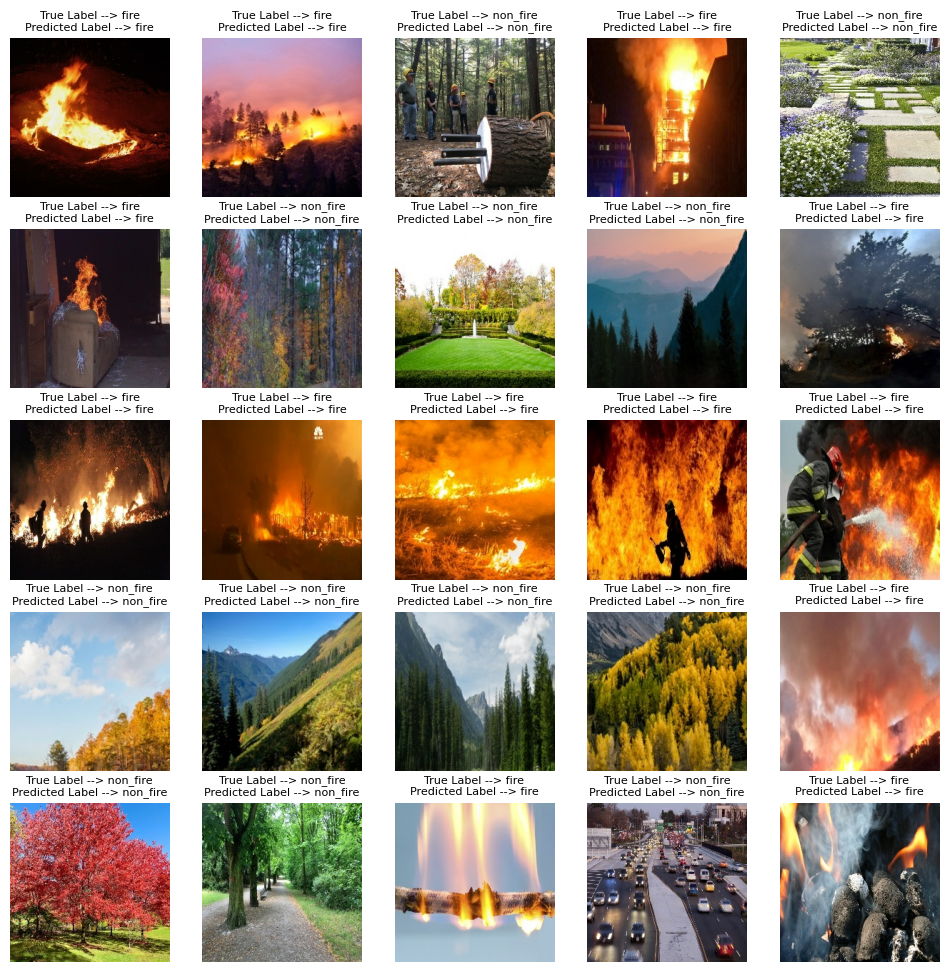

time: 15.9 s (started: 2023-09-03 13:25:18 +00:00)


In [48]:
# Choose Random images from test dataset and predict the class
plt.figure(figsize = (12,12))

for images, labels in test_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5,5, i+1)
        predicted = model_final(tf.expand_dims(images[i], axis = 0))
        predicted = 0 if predicted <=0.5 else 1
        label = int(labels[i])
        plt.imshow(images[i]/255.)
        plt.title("True Label --> " + CONFIGURATION["CLASS_NAMES"][label]+ "\n" + "Predicted Label --> "+ 
                  CONFIGURATION["CLASS_NAMES"][predicted], fontsize=8)
        plt.axis("off")

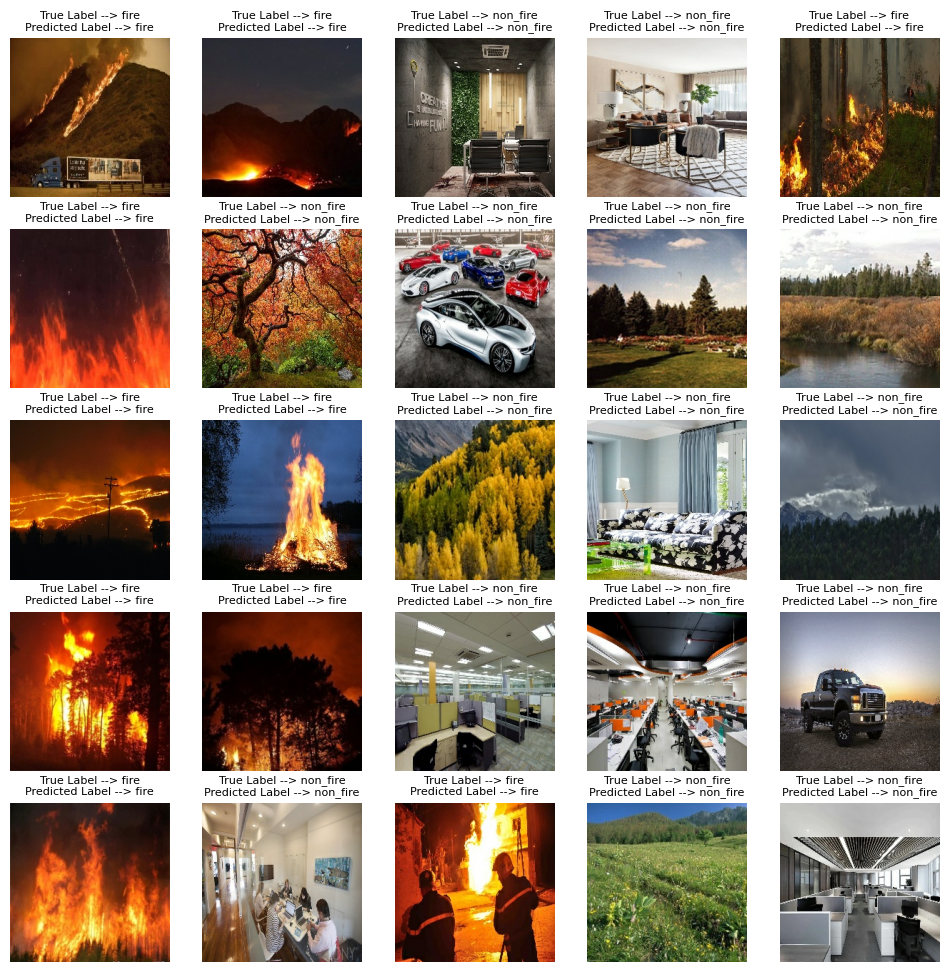

time: 16 s (started: 2023-09-03 13:25:34 +00:00)


In [49]:
# Choose Random images from test dataset and predict the class
plt.figure(figsize = (12,12))
test_dataset.skip(1)

for images, labels in test_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5,5, i+1)
        predicted = model_final(tf.expand_dims(images[i], axis = 0))
        predicted = 0 if predicted <=0.5 else 1
        label = int(labels[i])
        plt.imshow(images[i]/255.)
        plt.title("True Label --> " + CONFIGURATION["CLASS_NAMES"][label]+ "\n" + "Predicted Label --> "+ 
                  CONFIGURATION["CLASS_NAMES"][predicted], fontsize=8)
        plt.axis("off")
                 

# Testing saved model with non normalized images containing specfic scenarios

In [50]:
custom_test_data_dir = '/kaggle/input/custom-fire-testing-dataset/custom testing_Fire'
cusotm_test_dataset = create_ds(custom_test_data_dir, 36, augment=True, augment_fn=augment_layer)

Found 133 files belonging to 2 classes.
time: 102 ms (started: 2023-09-03 13:25:50 +00:00)


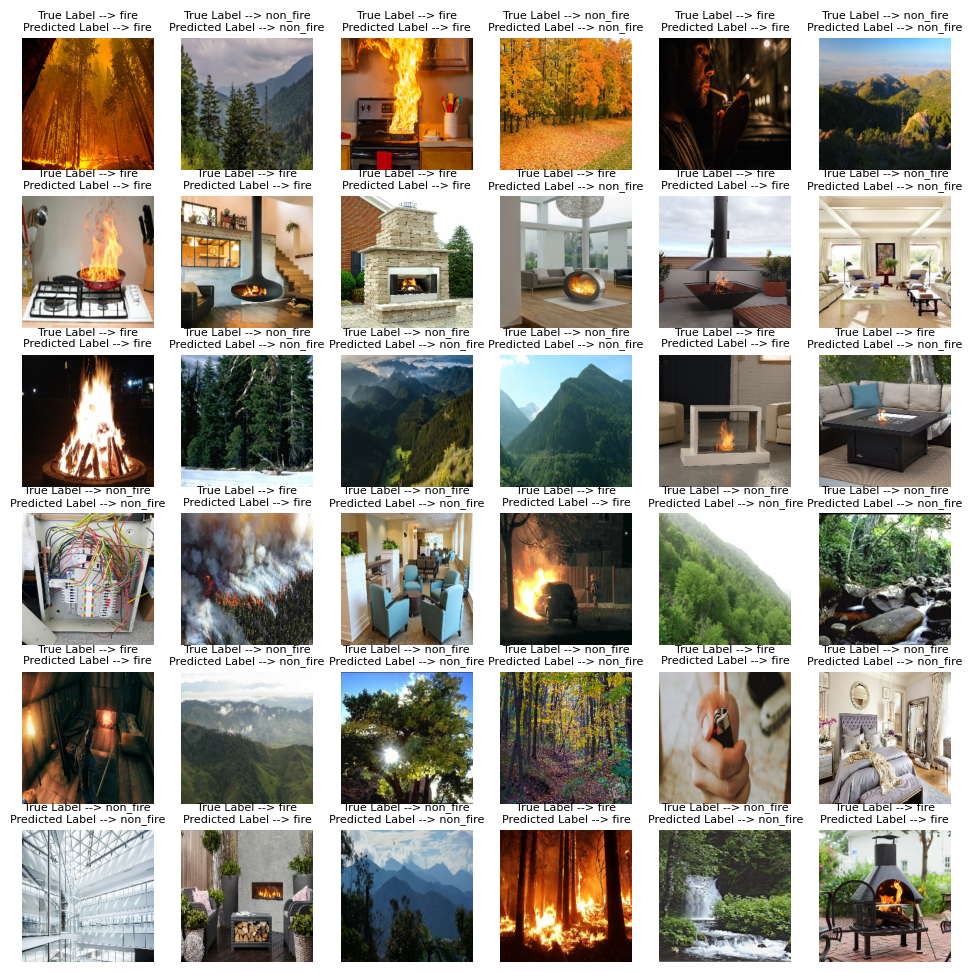

time: 24 s (started: 2023-09-03 13:26:46 +00:00)


In [51]:
# Choose Random images from test dataset and predict the class
plt.figure(figsize = (12,12))

for images, labels in cusotm_test_dataset.take(1):
    for i in range(36):
        ax = plt.subplot(6,6, i+1)
        predicted = model_final(tf.expand_dims(images[i], axis = 0))
        predicted = 0 if predicted <=0.5 else 1
        label = int(labels[i])
        plt.imshow(images[i]/255.)
        plt.title("True Label --> " + CONFIGURATION["CLASS_NAMES"][label]+ "\n" + "Predicted Label --> "+ 
                  CONFIGURATION["CLASS_NAMES"][predicted], fontsize=8)
        plt.axis("off")

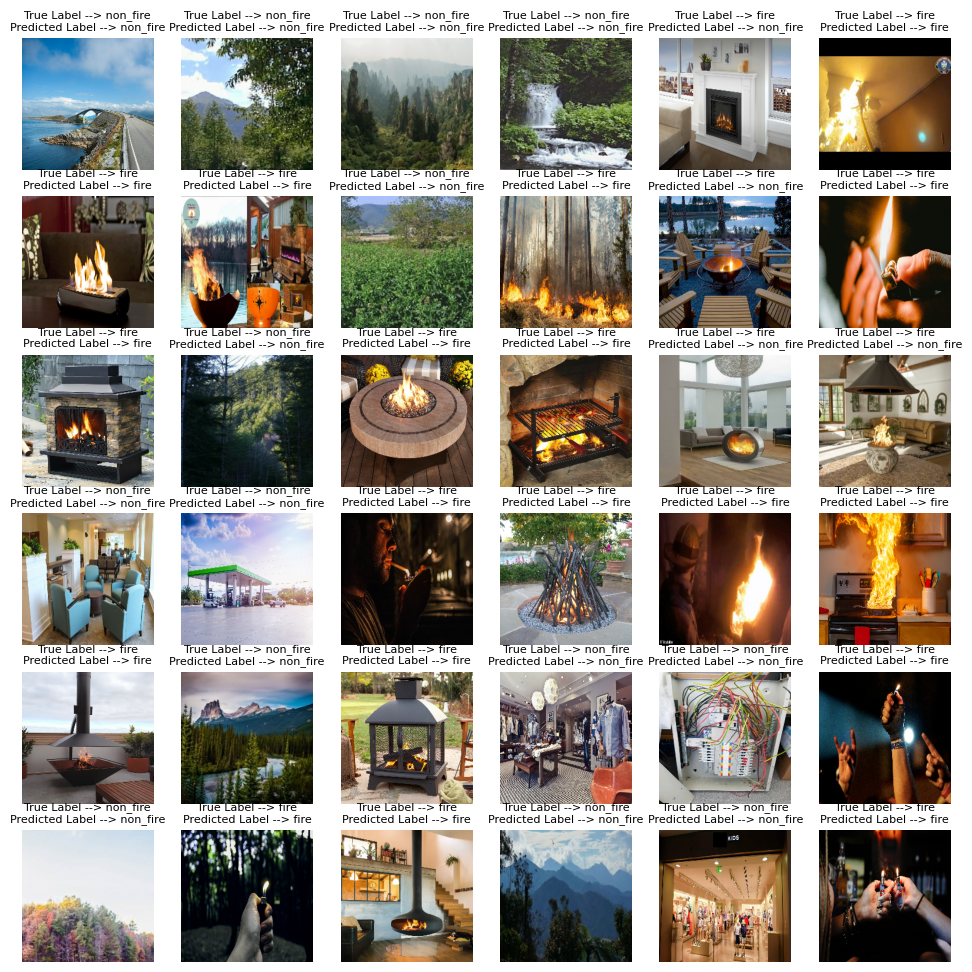

time: 43.5 s (started: 2023-09-03 13:32:09 +00:00)


In [54]:
# Choose Random images from test dataset and predict the class
plt.figure(figsize = (12,12))

cusotm_test_dataset.skip(1)
for images, labels in cusotm_test_dataset.take(1):
    for i in range(36):
        ax = plt.subplot(6,6, i+1)
        predicted = model_final(tf.expand_dims(images[i], axis = 0))
        predicted = 0 if predicted <=0.5 else 1
        label = int(labels[i])
        plt.imshow(images[i]/255.)
        plt.title("True Label --> " + CONFIGURATION["CLASS_NAMES"][label]+ "\n" + "Predicted Label --> "+ 
                  CONFIGURATION["CLASS_NAMES"][predicted], fontsize=8)
        plt.axis("off")

# Confusion Matrix

In [55]:
predicted = []
labels = []

for im, label in test_dataset:
    predicted.append(model_final(im).numpy())
    labels.append(label.numpy())

time: 9.54 s (started: 2023-09-03 13:32:53 +00:00)


In [56]:
# print("labels: ", labels)
labels = [i for sub in labels for i in sub]
predicted = [i for sub in predicted for i in sub]

labels = [0 if i <= 0.5 else 1 for i in labels]
predicted = [0 if i <= 0.5 else 1  for i in predicted]

time: 8.08 ms (started: 2023-09-03 13:33:03 +00:00)


[[238   6]
 [  4 276]]


Text(0.5, 58.7222222222222, 'Predicted')

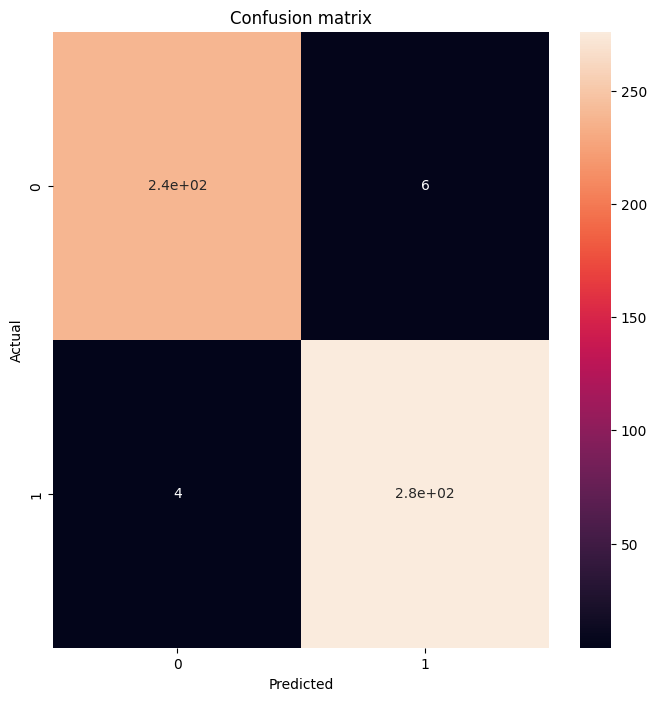

time: 889 ms (started: 2023-09-03 13:33:03 +00:00)


In [57]:
import seaborn as sns
cm = confusion_matrix(labels, predicted)
print(cm)
plt.figure(figsize=(8,8))

sns.heatmap(cm, annot=True,)
plt.title('Confusion matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [58]:
wandb.finish()

accuracy,▁▅▆▆▆▆▇▇▇▇▇▇▇█▇▇██████
epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█▁▁▂▃▃▃▄
loss,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
precision,▁▄▆▆▆▆▇▇▇▇▇▇▇█▇▇██████
recall,▁▅▆▆▆▇▆████▇▇█████████
val_accuracy,▃▅▃▁▃▅▅▆▆▅▆█▆█▆▃▆▆▅▅▆▅
val_loss,█▄▂▃▂▃▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▁
val_precision,▅▁▅▁▁▂▄▄▇▅▇█▇█▇▅▄▅▄▅▅▅
val_recall,▁█▁▅▆▆▅▆▃▃▃▃▃▃▃▁▆▅▅▃▅▃
accuracy,0.99776
best_epoch,0


time: 4.82 s (started: 2023-09-03 13:34:40 +00:00)


# Finding The best  Small model
In some cases we need a smaller model to perfrom faster resuls while maintaining acceptable results. 

# Keras Tuner

In [59]:
# Define a simple model function
def build_model(hp):
    BASE_MDOEL_CHOICE = hp.Choice('BaseModel', values= ['MobileNetV2','DenseNet121','EfficientNetV2B1','NASNetMobile'])
    NEURONS_L1 = hp.Choice('NeuronsL1', values=[32,64,128])
    NEURONS_L2 = hp.Choice('NeuronsL2', values=[32,64,128])
    
#     DROP_OUT = hp.Choice('DropOut', values=[0.1,0.2,0.3])
#     BATCH_SIZE = hp.Choice('BatchSize', values=[32,64,128])
#     LEARNING_RATE = hp.Choice('LearningRate', values=[1e-4,1e-3,1e-2,1e-1])

#     OPTIMIZER_CHOICE = hp.Choice('Optimizer', values=['Adam','RMSprop','SGD'])
    
        
    BATCH_SIZE = CONFIGURATION["BATCH_SIZE"]
    LEARNING_RATE = CONFIGURATION["LEARNING_RATE"]
    REGULARIZATION_RATE = CONFIGURATION["REGULARIZATION_RATE"] 
    DROP_OUT =  CONFIGURATION["DROPOUT_RATE"]
    
#     if OPTIMIZER_CHOICE == 'Adam':
#         OPTIMIZER =  Adam(learning_rate=LEARNING_RATE) 
#     elif OPTIMIZER_CHOICE =='RMSprop':
#         OPTIMZER = RMSprop(learning_rate=LEARNING_RATE)
#     elif OPTIMIZER_CHOICE == 'SGD':
#         OPTIMZER = SGD(learning_rate=LEARNING_RATE)

    OPTIMIZER = Adam(learning_rate = LEARNING_RATE)  
        
        
    global train_dataset, val_dataset, test_dataset
    train_dataset= create_ds(train_data_dir,BATCH_SIZE, augment=True, augment_fn=augment_layer)
    val_dataset = create_ds(val_data_dir,BATCH_SIZE, augment=False )
    test_dataset = create_ds(test_data_dir, BATCH_SIZE, augment=False)
    
    base_model = base_models[BASE_MDOEL_CHOICE]
    preprocess_input = pre_processing_functions[BASE_MDOEL_CHOICE]

    fine_tune_limit = len(base_model.layers) - int(0.1*len(base_model.layers))
    base_model.trainable = True
    for layer in base_model.layers[:fine_tune_limit]:
        layer.trainable=False


    inputs = Input(shape = (None, None, 3), name='input_layer')
    x = resize_layers(inputs)
    x = preprocess_input(x)
    
    #Run base model in Inference mode by passing training=false,This is important for fine-tuning.
    x = base_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dropout(DROP_OUT)(x)
    
    x = Dense(NEURONS_L1, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_1')(x)
    x = BatchNormalization()(x)  
    
    x = Dense(NEURONS_L2, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_2')(x)
    x = BatchNormalization()(x) 
    
    # x = Dense(NEURONS_L3, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_3')(x)
    x = Dropout(DROP_OUT)(x)

    outputs =  Dense(1, activation='sigmoid', name='output_layer')(x)
    small_model = Model(inputs, outputs)

    #     steps_per_epoch = train_generator.n // BATCH_SIZE  
    #     validation_steps = val_generator.n // BATCH_SIZE

    small_model.compile(optimizer= OPTIMIZER,loss='binary_crossentropy',metrics=METRICS)
    return small_model

time: 3.47 ms (started: 2023-09-03 13:37:23 +00:00)


In [ ]:
# clear_kaggle_folders(kaggle_folders)

In [ ]:
# Reset the tuner
# tuner.clear_state()

In [65]:
# Initialize the Keras Tuner RandomSearch object
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',  # Metric to optimize
    max_trials=50,              # Number of different model configurations to try
    executions_per_trial=1,
    directory='keras_tuner_dir',
    project_name="FireDetection",# Directory to store tuning results
    overwrite=True , # This ensures that only the latest checkpoint is saved
    )

# Search for the best hyperparameter configuration
tuner.search(train_dataset,
             epochs=3,
             validation_data=val_dataset,
             callbacks=CALLBACKS )

Trial 36 Complete [00h 01m 31s]
val_accuracy: 0.9756097793579102

Best val_accuracy So Far: 0.9918699264526367
Total elapsed time: 00h 42m 43s
time: 42min 47s (started: 2023-09-03 14:14:50 +00:00)


In [66]:
tuner.results_summary()

Results summary
Results in keras_tuner_dir/FireDetection
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 00 summary
Hyperparameters:
BaseModel: EfficientNetV2B1
NeuronsL1: 32
NeuronsL2: 64
Score: 0.9918699264526367

Trial 04 summary
Hyperparameters:
BaseModel: EfficientNetV2B1
NeuronsL1: 32
NeuronsL2: 32
Score: 0.9898374080657959

Trial 12 summary
Hyperparameters:
BaseModel: EfficientNetV2B1
NeuronsL1: 64
NeuronsL2: 128
Score: 0.9878048896789551

Trial 18 summary
Hyperparameters:
BaseModel: EfficientNetV2B1
NeuronsL1: 64
NeuronsL2: 32
Score: 0.9878048896789551

Trial 33 summary
Hyperparameters:
BaseModel: DenseNet121
NeuronsL1: 32
NeuronsL2: 32
Score: 0.9878048896789551

Trial 15 summary
Hyperparameters:
BaseModel: EfficientNetV2B1
NeuronsL1: 64
NeuronsL2: 64
Score: 0.9857723712921143

Trial 20 summary
Hyperparameters:
BaseModel: EfficientNetV2B1
NeuronsL1: 128
NeuronsL2: 128
Score: 0.9857723712921143

Trial 05 summary
Hyperparameters:
BaseModel: DenseNet1

In [67]:
# Get the top hyperparameters.
best_hps = tuner.get_best_hyperparameters(5)
# Build the model with the best hp.
small_model = build_model(best_hps[0])
small_model.summary()

Found 4014 files belonging to 2 classes.
Found 492 files belonging to 2 classes.
Found 524 files belonging to 2 classes.
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, None, None, 3)]   0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 efficientnetv2-b1 (Function  (None, 7, 7, 1280)       6931124   
 al)                                                             
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_2 (Dropout)         (None, 1280)              0         
    

In [68]:
best_hps = tuner.get_best_hyperparameters()[0]
print("Best Hyperparameters:")
print(best_hps.values)  # Dictionary containing the best hyperparameters

Best Hyperparameters:
{'BaseModel': 'EfficientNetV2B1', 'NeuronsL1': 32, 'NeuronsL2': 64}
time: 1.03 ms (started: 2023-09-03 14:57:40 +00:00)


# Size of models

In [69]:
for model_name in base_models:
    model = base_models[model_name]
    print(model.name)
    print(model.count_params()/1024)
    print(" --------- ")

efficientnetv2-m
51904.67578125
 --------- 
inception_resnet_v2
53063.21875
 --------- 
mobilenetv2_1.00_224
2205.0625
 --------- 
densenet121
6872.5625
 --------- 
efficientnetv2-b1
6768.67578125
 --------- 
NASNet
4169.64453125
 --------- 
time: 103 ms (started: 2023-09-03 14:57:40 +00:00)


# Re-build and Fine Tune best small model

In [27]:
# Initialize wandb
wandb.init(project="FireDataset")

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
cat: /sys/module/amdgpu/initstate: No such file or directory


time: 52.6 s (started: 2023-09-04 09:01:47 +00:00)


In [28]:
wandb_callBack = WandbCallback(monitor="val_loss", verbose=0, mode="auto", )
CSVLogger_callback = CSVLogger('logs.csv',separator=',', append=True)
EarlyStopping_callback = EarlyStopping(monitor='val_loss', min_delta=0, patience=6, 
                                       verbose=1,mode='auto', baseline=None, restore_best_weights=False)
ReduceLROnPlateau_callback = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=5, verbose=1)

CALLBACKS_with_wandb = [wandb_callBack, CSVLogger_callback, EarlyStopping_callback, ReduceLROnPlateau_callback]

wandb: WARNING The save_model argument by default saves the model in the HDF5 format that cannot save custom objects like subclassed models and custom layers. This behavior will be deprecated in a future release in favor of the SavedModel format. Meanwhile, the HDF5 model is saved as W&B files and the SavedModel as W&B Artifacts.


time: 10.9 s (started: 2023-09-04 09:03:00 +00:00)


In [29]:
# Re define metrics so that the saved model does not contain f1-socre (it will lead to error when loading the model)
METRICS = [
    Recall(name='recall'),
    Precision(name='precision'), 
    BinaryAccuracy(name='accuracy')
     ]

time: 23.4 ms (started: 2023-09-04 09:03:43 +00:00)


# Hyper parameters for highest accuracy model

#### Best Hyperparameters:
- BaseModel: EfficientNetV2B1
- NeuronsL1: 32
- NeuronsL2: 64

Score: 0.9918699264526367

In [31]:
# best_base_model_choice = best_hps.get('BaseModel')
# best_NEURONS_L1_choice = best_hps.get('NeuronsL1')
# best_NEURONS_L2_choice = best_hps.get('NeuronsL2')

best_base_model_choice = 'EfficientNetV2B1'
best_NEURONS_L1_choice = 32
best_NEURONS_L2_choice = 64

time: 2.05 ms (started: 2023-09-04 09:05:12 +00:00)


# Create model

In [32]:
BASE_MDOEL_CHOICE = best_base_model_choice
NEURONS_L1 = best_NEURONS_L1_choice 
NEURONS_L2 = best_NEURONS_L2_choice
    
BATCH_SIZE = CONFIGURATION["BATCH_SIZE"]
LEARNING_RATE = CONFIGURATION["LEARNING_RATE"]
REGULARIZATION_RATE = CONFIGURATION["REGULARIZATION_RATE"] 
DROP_OUT =  CONFIGURATION["DROPOUT_RATE"] 
            
train_dataset= create_ds(train_data_dir,BATCH_SIZE, augment=True, augment_fn=augment_layer)
val_dataset = create_ds(val_data_dir,BATCH_SIZE, augment=False )
test_dataset = create_ds(test_data_dir, BATCH_SIZE, augment=False)

base_model = base_models[BASE_MDOEL_CHOICE]
base_model.trainable = False

preprocess_input = pre_processing_functions[BASE_MDOEL_CHOICE]

inputs = Input(shape = (None, None, 3), name='input_layer')
x = resize_layers(inputs)
x = preprocess_input(x)

#Run base model in Inference mode by passing training=false,This is important for fine-tuning.
x = base_model(x, training=False)
x = GlobalAveragePooling2D()(x)
x = Dropout(DROP_OUT)(x)
    
x = Dense(NEURONS_L1, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_1')(x)
x = BatchNormalization()(x)  
    
x = Dense(NEURONS_L2, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_2')(x)
x = BatchNormalization()(x) 
    
# x = Dense(NEURONS_L3, activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE), name='dense_layer_3')(x)
x = Dropout(DROP_OUT)(x)

outputs =  Dense(1, activation='sigmoid', name='output_layer')(x)
small_model = Model(inputs, outputs)

    #     steps_per_epoch = train_generator.n // BATCH_SIZE  
    #     validation_steps = val_generator.n // BATCH_SIZE

small_model.compile(optimizer= Adam(learning_rate=CONFIGURATION["LEARNING_RATE"] ),loss='binary_crossentropy',metrics=METRICS)
small_model.summary()

Found 4014 files belonging to 2 classes.
Found 492 files belonging to 2 classes.
Found 524 files belonging to 2 classes.
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, None, None, 3)]   0         
                                                                 
 sequential_4 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 efficientnetv2-b1 (Function  (None, 7, 7, 1280)       6931124   
 al)                                                             
                                                                 
 global_average_pooling2d_2   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_4 (Dropout)         (None, 1280)              0         
    

# Train 40 epochs

In [33]:
history = small_model.fit(train_dataset,
                         epochs= CONFIGURATION["EPOCHS"], 
                         callbacks=CALLBACKS_with_wandb,
                         validation_data=val_dataset,
                         class_weight=CONFIGURATION["CLASS_WEIGHT"] )

Epoch 1/50
126/126 [==============================] - ETA: 0s - loss: 0.2600 - recall: 0.9313 - precision: 0.9491 - accuracy: 0.9385

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230904_090207-2r085o4f/files/model-best)... Done. 0.2s


126/126 [==============================] - 113s 716ms/step - loss: 0.2600 - recall: 0.9313 - precision: 0.9491 - accuracy: 0.9385 - val_loss: 0.2141 - val_recall: 0.9438 - val_precision: 0.9882 - val_accuracy: 0.9634 - lr: 0.0010
Epoch 2/50
125/126 [============================>.] - ETA: 0s - loss: 0.1762 - recall: 0.9745 - precision: 0.9745 - accuracy: 0.9735

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230904_090207-2r085o4f/files/model-best)... Done. 0.2s


126/126 [==============================] - 87s 691ms/step - loss: 0.1759 - recall: 0.9746 - precision: 0.9746 - accuracy: 0.9736 - val_loss: 0.1665 - val_recall: 0.9775 - val_precision: 0.9886 - val_accuracy: 0.9817 - lr: 0.0010
Epoch 3/50
125/126 [============================>.] - ETA: 0s - loss: 0.1437 - recall: 0.9817 - precision: 0.9822 - accuracy: 0.9812

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230904_090207-2r085o4f/files/model-best)... Done. 0.2s


126/126 [==============================] - 88s 700ms/step - loss: 0.1436 - recall: 0.9818 - precision: 0.9822 - accuracy: 0.9813 - val_loss: 0.1615 - val_recall: 0.9775 - val_precision: 0.9924 - val_accuracy: 0.9837 - lr: 0.0010
Epoch 4/50
125/126 [============================>.] - ETA: 0s - loss: 0.1240 - recall: 0.9909 - precision: 0.9866 - accuracy: 0.9883

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230904_090207-2r085o4f/files/model-best)... Done. 0.2s


126/126 [==============================] - 89s 704ms/step - loss: 0.1239 - recall: 0.9909 - precision: 0.9866 - accuracy: 0.9883 - val_loss: 0.1533 - val_recall: 0.9775 - val_precision: 0.9924 - val_accuracy: 0.9837 - lr: 0.0010
Epoch 5/50
126/126 [==============================] - 11s 82ms/step - loss: 0.1268 - recall: 0.9822 - precision: 0.9865 - accuracy: 0.9838 - val_loss: 0.1551 - val_recall: 0.9775 - val_precision: 0.9924 - val_accuracy: 0.9837 - lr: 0.0010
Epoch 6/50
125/126 [============================>.] - ETA: 0s - loss: 0.1111 - recall: 0.9870 - precision: 0.9870 - accuracy: 0.9865

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230904_090207-2r085o4f/files/model-best)... Done. 0.2s


126/126 [==============================] - 91s 720ms/step - loss: 0.1113 - recall: 0.9870 - precision: 0.9866 - accuracy: 0.9863 - val_loss: 0.1490 - val_recall: 0.9850 - val_precision: 0.9925 - val_accuracy: 0.9878 - lr: 0.0010
Epoch 7/50
125/126 [============================>.] - ETA: 0s - loss: 0.0952 - recall: 0.9913 - precision: 0.9928 - accuracy: 0.9918

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230904_090207-2r085o4f/files/model-best)... Done. 0.2s


126/126 [==============================] - 89s 708ms/step - loss: 0.0951 - recall: 0.9914 - precision: 0.9928 - accuracy: 0.9918 - val_loss: 0.1445 - val_recall: 0.9850 - val_precision: 0.9925 - val_accuracy: 0.9878 - lr: 0.0010
Epoch 8/50
125/126 [============================>.] - ETA: 0s - loss: 0.0901 - recall: 0.9928 - precision: 0.9890 - accuracy: 0.9905

wandb: Adding directory to artifact (/kaggle/working/wandb/run-20230904_090207-2r085o4f/files/model-best)... Done. 0.2s


126/126 [==============================] - 87s 695ms/step - loss: 0.0900 - recall: 0.9928 - precision: 0.9890 - accuracy: 0.9905 - val_loss: 0.1378 - val_recall: 0.9775 - val_precision: 0.9924 - val_accuracy: 0.9837 - lr: 0.0010
Epoch 9/50
126/126 [==============================] - 11s 80ms/step - loss: 0.0932 - recall: 0.9866 - precision: 0.9918 - accuracy: 0.9888 - val_loss: 0.1414 - val_recall: 0.9850 - val_precision: 0.9887 - val_accuracy: 0.9858 - lr: 0.0010
Epoch 10/50
126/126 [==============================] - 10s 80ms/step - loss: 0.0809 - recall: 0.9918 - precision: 0.9909 - accuracy: 0.9910 - val_loss: 0.1511 - val_recall: 0.9738 - val_precision: 0.9924 - val_accuracy: 0.9817 - lr: 0.0010
Epoch 11/50
125/126 [============================>.] - ETA: 0s - loss: 0.0707 - recall: 0.9947 - precision: 0.9947 - accuracy: 0.9945
Epoch 11: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
126/126 [==============================] - 11s 81ms/step - loss: 0.0711 - recall

In [35]:
small_model.evaluate(test_dataset)

17/17 [==============================] - 3s 102ms/step - loss: 0.1037 - recall: 0.9857 - precision: 0.9822 - accuracy: 0.9828


[0.10371998697519302, 0.9857142567634583, 0.982206404209137, 0.982824444770813]

time: 3.06 s (started: 2023-09-04 09:26:34 +00:00)


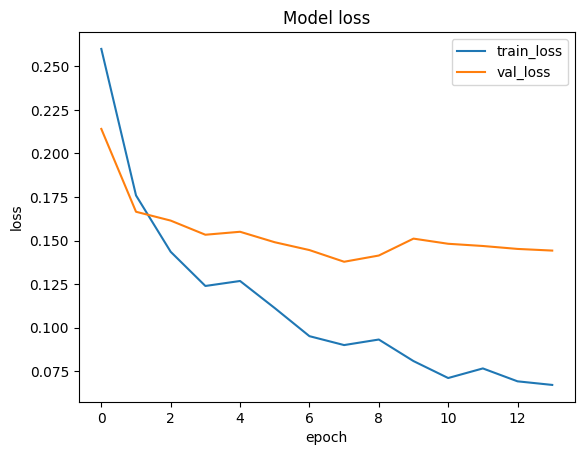

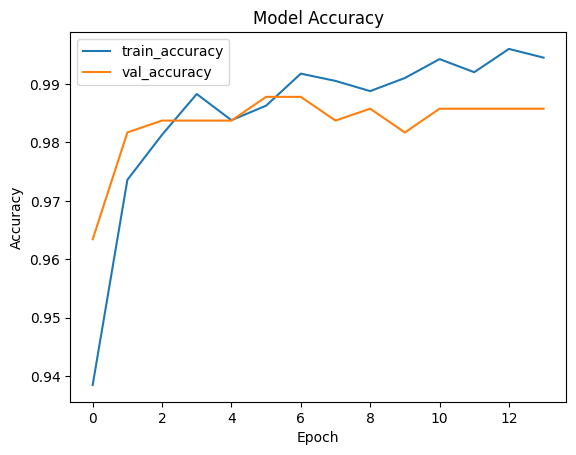

time: 788 ms (started: 2023-09-04 09:26:42 +00:00)


In [36]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss', 'val_loss'])
plt.show()

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train_accuracy', 'val_accuracy'])
plt.show()

# Fine Tuning

In [39]:
#Fine Tuning
# Fine Tuning
base_model.trainable = True
fine_tune_limit = len(base_model.layers) - int(0.05*len(base_model.layers))

for layer in base_model.layers[:fine_tune_limit]:
    layer.trainable=False

small_model.compile(optimizer= Adam(learning_rate =CONFIGURATION["LEARNING_RATE_FINE_TUNING"] ), loss='binary_crossentropy', metrics=METRICS)

time: 48.8 ms (started: 2023-09-04 09:27:19 +00:00)


In [40]:
history_fine_tuning = small_model.fit(train_dataset,
                         epochs= CONFIGURATION["FINE_TUNING_EPOCHS"], 
                         callbacks=CALLBACKS_with_wandb,
                         validation_data=val_dataset,
                         class_weight=CONFIGURATION["CLASS_WEIGHT"])

Epoch 1/50
126/126 [==============================] - 36s 112ms/step - loss: 0.0734 - recall: 0.9911 - precision: 0.9899 - accuracy: 0.9901 - val_loss: 0.1454 - val_recall: 0.9775 - val_precision: 0.9924 - val_accuracy: 0.9837 - lr: 1.0000e-05
Epoch 2/50
126/126 [==============================] - 11s 86ms/step - loss: 0.0657 - recall: 0.9962 - precision: 0.9947 - accuracy: 0.9953 - val_loss: 0.1455 - val_recall: 0.9813 - val_precision: 0.9924 - val_accuracy: 0.9858 - lr: 1.0000e-05
Epoch 3/50
126/126 [==============================] - 11s 85ms/step - loss: 0.0650 - recall: 0.9942 - precision: 0.9966 - accuracy: 0.9953 - val_loss: 0.1445 - val_recall: 0.9813 - val_precision: 0.9924 - val_accuracy: 0.9858 - lr: 1.0000e-05
Epoch 4/50
126/126 [==============================] - 11s 85ms/step - loss: 0.0623 - recall: 0.9981 - precision: 0.9957 - accuracy: 0.9968 - val_loss: 0.1471 - val_recall: 0.9775 - val_precision: 0.9924 - val_accuracy: 0.9837 - lr: 1.0000e-05
Epoch 5/50
126/126 [=======

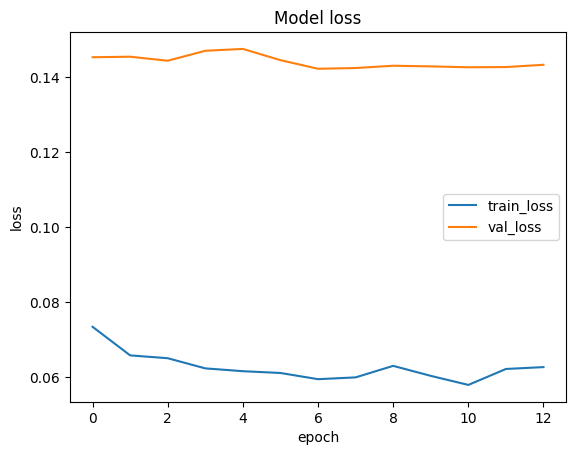

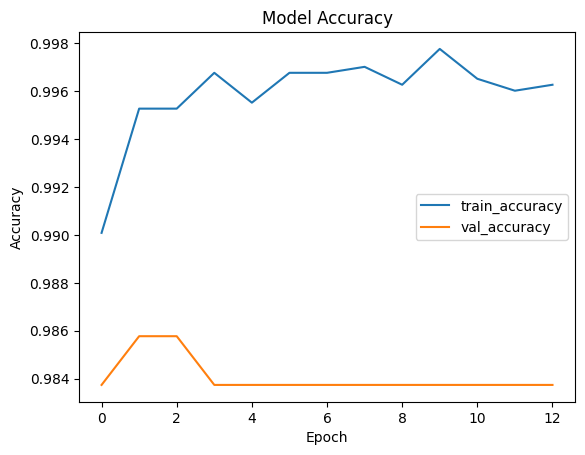

time: 637 ms (started: 2023-09-04 09:30:55 +00:00)


In [41]:
plt.plot(history_fine_tuning.history['loss'])
plt.plot(history_fine_tuning.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss', 'val_loss'])
plt.show()

plt.plot(history_fine_tuning.history['accuracy'])
plt.plot(history_fine_tuning.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train_accuracy', 'val_accuracy'])
plt.show()

# Evaluate the model

In [42]:
# Evaluate the model on the test dataset
small_model.evaluate(test_dataset)

17/17 [==============================] - 1s 66ms/step - loss: 0.1032 - recall: 0.9857 - precision: 0.9857 - accuracy: 0.9847


[0.10323851555585861,
 0.9857142567634583,
 0.9857142567634583,
 0.9847328066825867]

time: 1.52 s (started: 2023-09-04 09:30:56 +00:00)


# Save the model

In [43]:
# Assuming you have a Keras model named "model"
small_model.save('small_model.h5')

time: 592 ms (started: 2023-09-04 09:31:25 +00:00)


In [44]:
# Assuming you have a Keras model named "model"
tf.saved_model.save(small_model, 'small_model')

time: 1min 15s (started: 2023-09-04 09:31:30 +00:00)


In [ ]:
# clear_kaggle_folders(kaggle_folders)

In [45]:
import zipfile

# Specify the paths
model_dir = 'small_model'
zip_file_name = 'small_model.zip'

# Create a ZIP archive
with zipfile.ZipFile(zip_file_name, 'w', zipfile.ZIP_DEFLATED) as zipf:
    # Recursively add the model directory to the archive
    for root, _, files in os.walk(model_dir):
        for file in files:
            file_path = os.path.join(root, file)
            archive_path = os.path.relpath(file_path, model_dir)
            zipf.write(file_path, archive_path)

time: 2.19 s (started: 2023-09-04 09:32:46 +00:00)


# Load saved model

In [26]:
small_model = tf.keras.models.load_model('/kaggle/working/small_model.h5')

time: 4.66 s (started: 2023-09-04 14:24:52 +00:00)


In [27]:
# Evaluate the loaded model on the test dataset
small_model.evaluate(test_dataset)

17/17 [==============================] - 12s 109ms/step - loss: 0.1032 - recall: 0.9857 - precision: 0.9857 - accuracy: 0.9847


[0.1032385602593422,
 0.9857142567634583,
 0.9857142567634583,
 0.9847328066825867]

time: 12.5 s (started: 2023-09-04 14:24:57 +00:00)


# Testing saved model

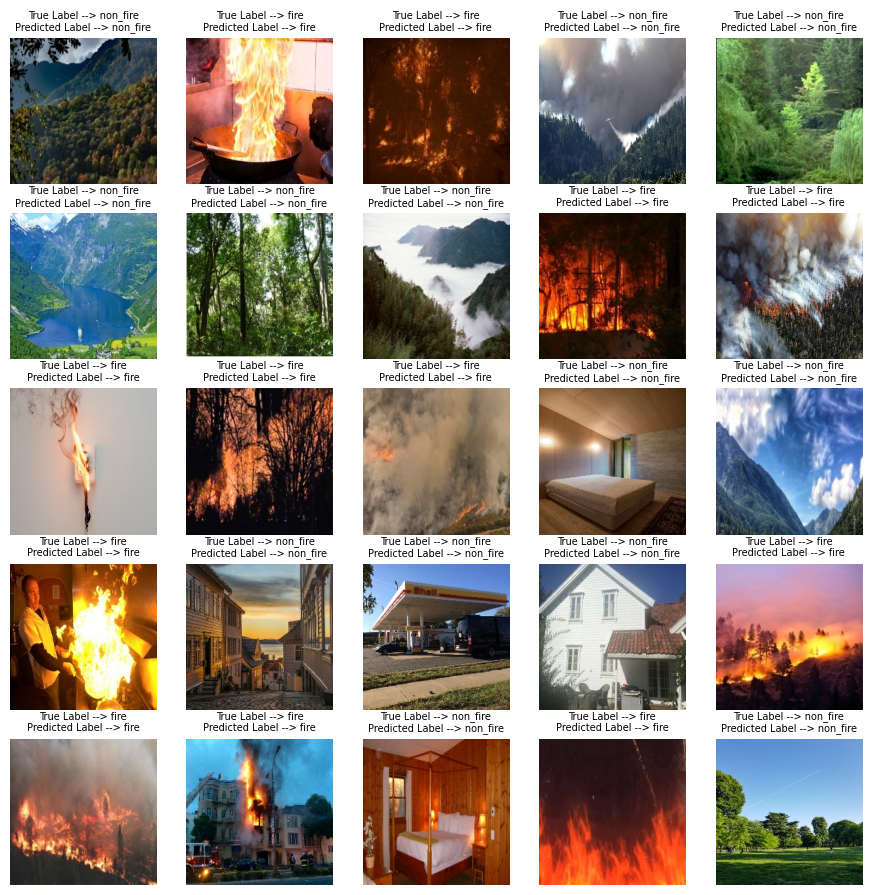

time: 8.72 s (started: 2023-09-04 14:28:42 +00:00)


In [32]:
# Choose Random images from test dataset and predict the class
plt.figure(figsize = (11,11))

for images, labels in test_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5,5, i+1)
        predicted = small_model(tf.expand_dims(images[i], axis = 0))
        predicted = 0 if predicted <=0.5 else 1
        label = int(labels[i])
        plt.imshow(images[i]/255.)
        plt.title("True Label --> " + CONFIGURATION["CLASS_NAMES"][label]+ "\n" + "Predicted Label --> "+ 
                  CONFIGURATION["CLASS_NAMES"][predicted], fontsize=7)
        plt.axis("off")

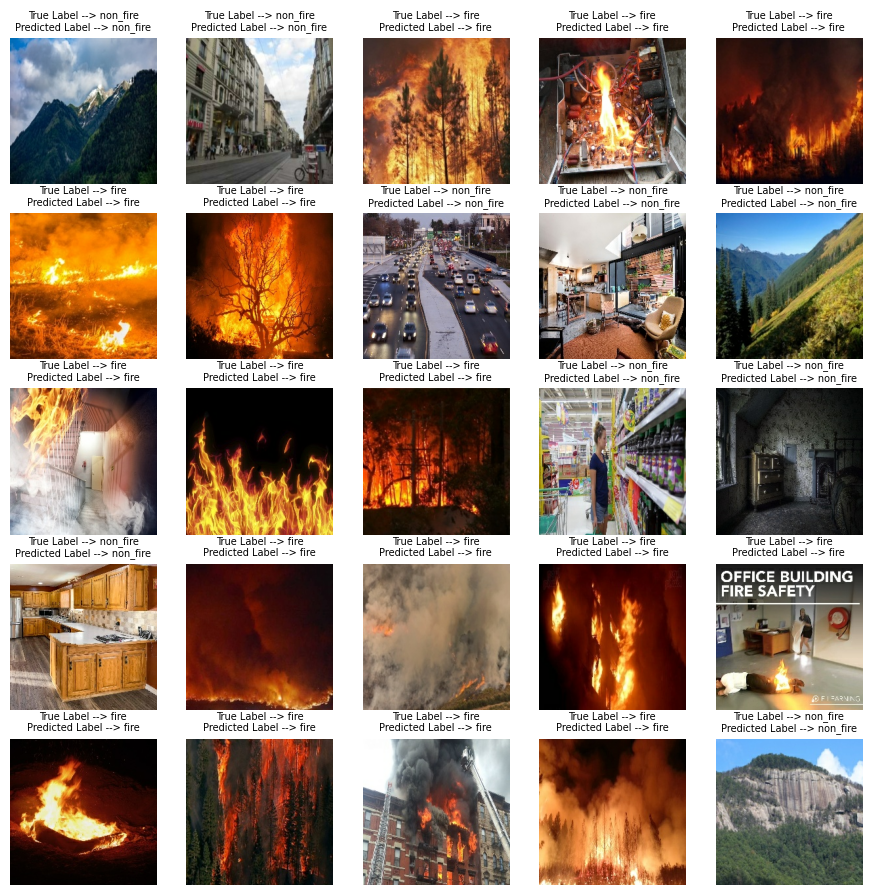

time: 9.12 s (started: 2023-09-04 14:29:48 +00:00)


In [34]:
# Choose Random images from test dataset and predict the class
plt.figure(figsize = (11,11))
test_dataset.skip(2)

for images, labels in test_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5,5, i+1)
        predicted = small_model(tf.expand_dims(images[i], axis = 0))
        predicted = 0 if predicted <=0.5 else 1
        label = int(labels[i])
        plt.imshow(images[i]/255.)
        plt.title("True Label --> " + CONFIGURATION["CLASS_NAMES"][label]+ "\n" + "Predicted Label --> "+ 
                  CONFIGURATION["CLASS_NAMES"][predicted], fontsize=7)
        plt.axis("off")              

# Testing saved model with non normalized images containing specfic scenarios

In [35]:
custom_test_data_dir = '/kaggle/input/custom-fire-testing-dataset/custom testing_Fire'
cusotm_test_dataset = create_ds(custom_test_data_dir, 36, augment=True, augment_fn=augment_layer)

Found 133 files belonging to 2 classes.
time: 98.5 ms (started: 2023-09-04 14:30:49 +00:00)


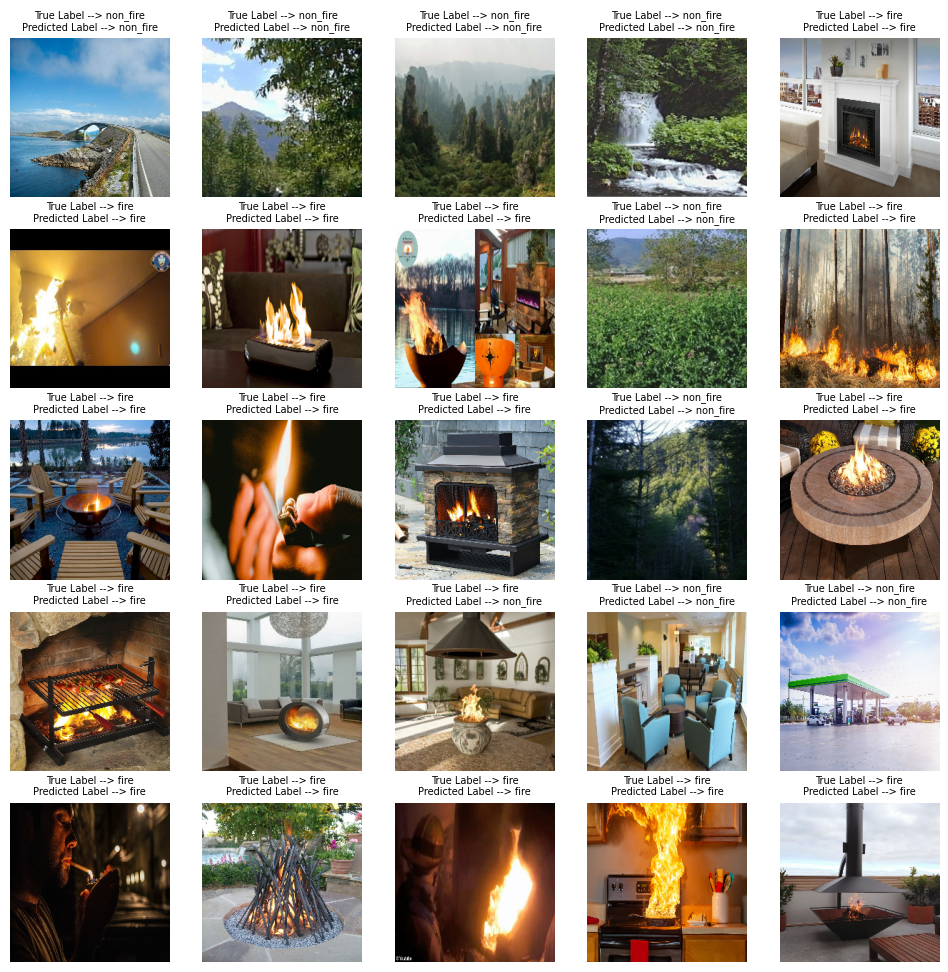

time: 10.1 s (started: 2023-09-04 14:36:51 +00:00)


In [38]:
# Choose Random images from test dataset and predict the class
plt.figure(figsize = (12,12))

for images, labels in cusotm_test_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5,5, i+1)
        predicted = small_model(tf.expand_dims(images[i], axis = 0))
        predicted = 0 if predicted <=0.5 else 1
        label = int(labels[i])
        plt.imshow(images[i]/255.)
        plt.title("True Label --> " + CONFIGURATION["CLASS_NAMES"][label]+ "\n" + "Predicted Label --> "+ 
                  CONFIGURATION["CLASS_NAMES"][predicted], fontsize=7)
        plt.axis("off")

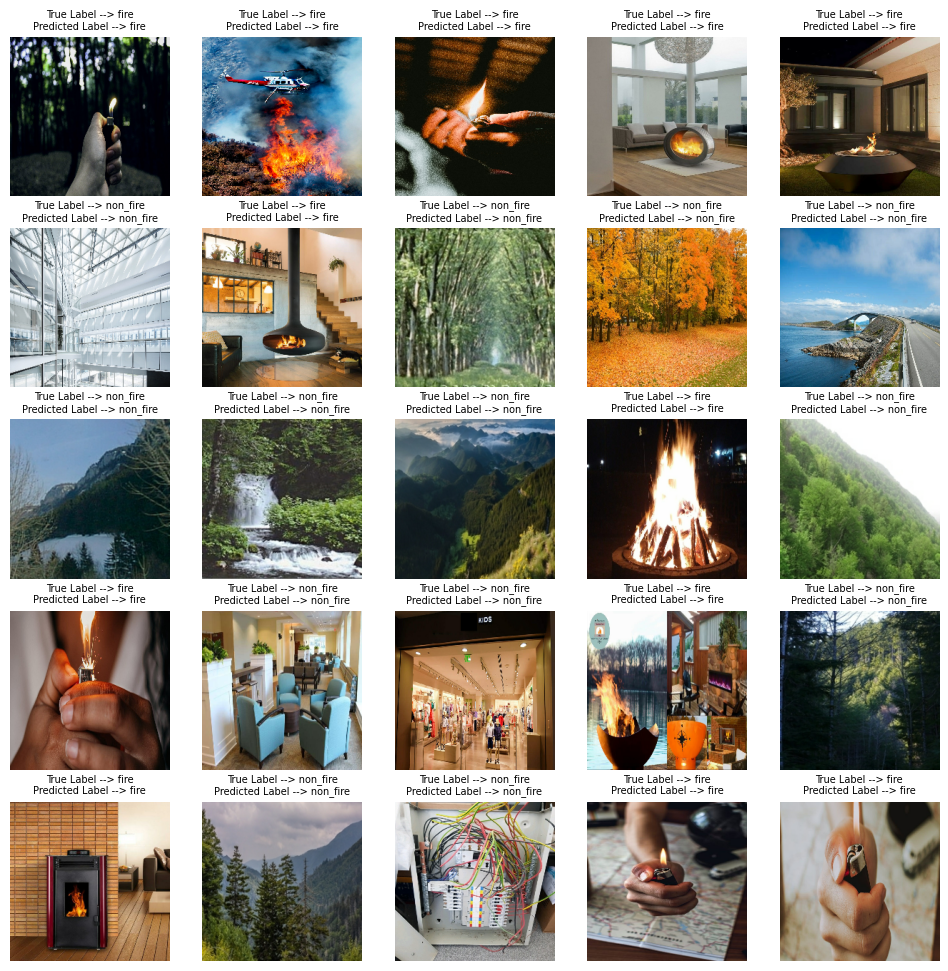

time: 10 s (started: 2023-09-04 14:39:12 +00:00)


In [40]:
# Choose Random images from test dataset and predict the class
plt.figure(figsize = (12,12))

cusotm_test_dataset.skip(1)
for images, labels in cusotm_test_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5,5, i+1)
        predicted = small_model(tf.expand_dims(images[i], axis = 0))
        predicted = 0 if predicted <=0.5 else 1
        label = int(labels[i])
        plt.imshow(images[i]/255.)
        plt.title("True Label --> " + CONFIGURATION["CLASS_NAMES"][label]+ "\n" + "Predicted Label --> "+ 
                  CONFIGURATION["CLASS_NAMES"][predicted], fontsize=7)
        plt.axis("off")

# Confusion Matrix

In [41]:
predicted = []
labels = []

for im, label in test_dataset:
    predicted.append(small_model(im).numpy())
    labels.append(label.numpy())
    
predicted = predicted
labels = labels

time: 4.32 s (started: 2023-09-04 14:40:01 +00:00)


In [42]:
# print("labels: ", labels)
labels = [ i for sub in labels for i in sub]
predicted =  [ i for sub in predicted for i in sub]

labels = [ 0 if i <= 0.5 else 1 for i in labels]
predicted = [ 0 if i <= 0.5 else 1  for i in predicted]


# print("labels: ", labels)
# print("predicted:", predicted )

time: 4.66 ms (started: 2023-09-04 14:40:10 +00:00)


[[240   4]
 [  4 276]]


Text(0.5, 58.7222222222222, 'Predicted')

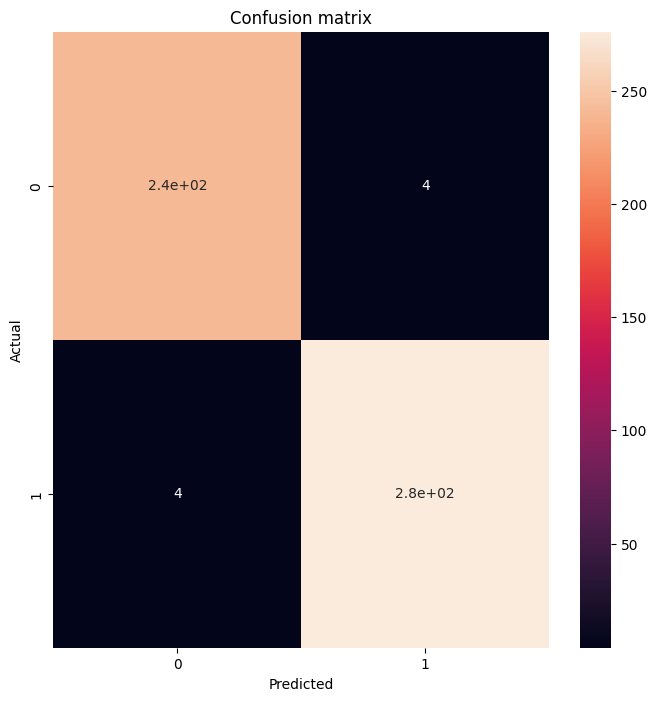

time: 840 ms (started: 2023-09-04 14:40:13 +00:00)


In [43]:
import seaborn as sns
cm = confusion_matrix(labels, predicted)
print(cm)
plt.figure(figsize=(8,8))

sns.heatmap(cm, annot=True,)
plt.title('Confusion matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [44]:
wandb.finish()

time: 443 µs (started: 2023-09-04 14:40:15 +00:00)


# End